In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os

os.chdir('/content/drive/MyDrive/Ericsson')

print(os.listdir())

['signals_flow.csv', 'signals.csv']


In [ ]:
df_signals = pd.read_csv('signals.csv')
display(df_signals.head())

,suite_id,suite_name,group,tc_name,name,specific_name,date,time,singal_area,source,content,kwargs
0,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-UL-CCCH-Message,RRC-RRCConnectionRequest,2024-08-12,17:35:46.687,rrc,send,#'RRC-UL-CCCH-Message'{\n message = \n ...,"{'node': 'msue', 'imsi': '123456', 'rb': 'srb0..."
1,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-DL-CCCH-Message,RRC-RRCConnectionSetup,2024-08-12,17:35:46.691,rrc,recv,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...","{'node': 'msue', 'imsi': '123456', 'rb': 'srb0..."
2,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,UP_ULRLCPE_RRCC_UL_COM_DATA_IND,NaN,2024-08-12,17:35:46.688,ose,send,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,"{'sig_no': '23068930', 'imsi': '123456', 'crnt..."
3,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_REQ,NaN,2024-08-12,17:35:46.690,ose,recv,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,"{'sig_no': '23134722', 'imsi': '123456', 'send..."
4,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_CFM,NaN,2024-08-12,17:35:46.690,ose,send,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,"{'sig_no': '23134723', 'imsi': '123456', 'send..."


In [ ]:
print('Count = ' + str(len(df_signals)))

Count = 392772


In [ ]:
df_signals['kwargs'].iloc[0]

"{'node': 'msue', 'imsi': '123456', 'rb': 'srb0', 'direction': 'send', 'pci': '101', 'earfcn': '2175', 'manual': 'false', 'container': 'false'}"

In [ ]:
import ast

def parse_kwargs_to_dict(kwargs_str):
        return ast.literal_eval(kwargs_str)


df_signals['kwargs_parsed'] = df_signals['kwargs'].apply(parse_kwargs_to_dict)

df_signals['earfcn'] = df_signals['kwargs_parsed'].apply(lambda x: x.get('earfcn'))
df_signals['earfcn'] = df_signals['earfcn'].fillna(0)
df_signals = df_signals.drop(columns=['kwargs_parsed'])


display(df_signals.head())

,suite_id,suite_name,group,tc_name,name,specific_name,date,time,singal_area,source,content,kwargs,earfcn
0,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-UL-CCCH-Message,RRC-RRCConnectionRequest,2024-08-12,17:35:46.687,rrc,send,#'RRC-UL-CCCH-Message'{\n message = \n ...,"{'node': 'msue', 'imsi': '123456', 'rb': 'srb0...",2175
1,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-DL-CCCH-Message,RRC-RRCConnectionSetup,2024-08-12,17:35:46.691,rrc,recv,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...","{'node': 'msue', 'imsi': '123456', 'rb': 'srb0...",2175
2,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,UP_ULRLCPE_RRCC_UL_COM_DATA_IND,NaN,2024-08-12,17:35:46.688,ose,send,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,"{'sig_no': '23068930', 'imsi': '123456', 'crnt...",0
3,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_REQ,NaN,2024-08-12,17:35:46.690,ose,recv,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,"{'sig_no': '23134722', 'imsi': '123456', 'send...",0
4,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_CFM,NaN,2024-08-12,17:35:46.690,ose,send,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,"{'sig_no': '23134723', 'imsi': '123456', 'send...",0


In [ ]:
import hashlib

def hash_string(text):
    if isinstance(text, str):
        return hashlib.sha256(text.encode('utf-8')).hexdigest()
    return None

In [ ]:
df_signals['content_earfcn'] = df_signals['content'].astype(str) + '_' + df_signals['earfcn'].astype(str)
df_signals['content_earfcn_hash'] = df_signals['content_earfcn'].apply(hash_string)


display(df_signals.head())
print('Count = ' + str(len(df_signals)))
print('Unique count = ' + str(len(df_signals['content_earfcn_hash'].unique())))

,suite_id,suite_name,group,tc_name,name,specific_name,date,time,singal_area,source,content,kwargs,earfcn,content_earfcn,content_earfcn_hash
0,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-UL-CCCH-Message,RRC-RRCConnectionRequest,2024-08-12,17:35:46.687,rrc,send,#'RRC-UL-CCCH-Message'{\n message = \n ...,"{'node': 'msue', 'imsi': '123456', 'rb': 'srb0...",2175,#'RRC-UL-CCCH-Message'{\n message = \n ...,5120d9f6839422a0e6919c0e5d8ce2b47f0d88d98c17ca...
1,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,RRC-DL-CCCH-Message,RRC-RRCConnectionSetup,2024-08-12,17:35:46.691,rrc,recv,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...","{'node': 'msue', 'imsi': '123456', 'rb': 'srb0...",2175,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...",29c9f84fdbf816cca447e4315e2bf695d9aab41ae0e2ae...
2,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,UP_ULRLCPE_RRCC_UL_COM_DATA_IND,NaN,2024-08-12,17:35:46.688,ose,send,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,"{'sig_no': '23068930', 'imsi': '123456', 'crnt...",0,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,1c3510bbdb963bbeecaa6dccbef73ee5ff40221e2c9840...
3,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_REQ,NaN,2024-08-12,17:35:46.690,ose,recv,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,"{'sig_no': '23134722', 'imsi': '123456', 'send...",0,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,4b0fe881dbae11f8767178a2a0ec8b78ddca57e21fd455...
4,238731208,emergency_inactivity_extension_SUITE,fdd,tc002_suspend_b1_after_qci1_release_when_em_ti...,BBMC_BBUEME_UEMI_UE_SETUP_CFM,NaN,2024-08-12,17:35:46.690,ose,send,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,"{'sig_no': '23134723', 'imsi': '123456', 'send...",0,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,e0bbf9aa01d6cab87817b304d61fb22868c03d42bf1e2c...


Count = 392772
Unique count = 275743


In [ ]:
# df_sorted = df_signals.sort_values(by=['suite_id', 'date', 'time']).reset_index(drop=True)
# display(df_sorted.tail())

In [ ]:
suite_counts = df_signals["suite_name"].value_counts()
median_count = suite_counts.median()

print("Mediana liczebności suite:", median_count)

diff = (suite_counts - median_count).abs()
closest_suites = diff.nsmallest(5).index.tolist()

print("5 suite najbliższych medianie:")
for s in closest_suites:
    print(s, "-", suite_counts[s])

df_filtered = df_signals[df_signals["suite_name"].isin(closest_suites)]


Mediana liczebności suite: 543.0
5 suite najbliższych medianie:
enhanced_mobility_with_mcpc_stm_mlstm_SUITE - 543
lte_intermode_handover_SUITE - 534
mcpc_with_machine_learning_SUITE - 557
asm_periodic_measurement_handling_SUITE - 560
ul_heavy_ue_intermode_handover_SUITE - 517


In [ ]:
df_filtered["suite_name"].unique()

array(['asm_periodic_measurement_handling_SUITE',
       'enhanced_mobility_with_mcpc_stm_mlstm_SUITE',
       'lte_intermode_handover_SUITE', 'mcpc_with_machine_learning_SUITE',
       'ul_heavy_ue_intermode_handover_SUITE'], dtype=object)

In [ ]:
import numpy as np

tc_lengths = (
    df_filtered
    .groupby(["suite_name", "tc_name"])
    .size()
    .rename("tc_length")
    .reset_index()
)

suite_stats = (
    tc_lengths
    .groupby("suite_name")["tc_length"]
    .agg(["mean", "std"])
    .reset_index()
)

suite_stats["threshold"] = suite_stats["mean"] + 3 * suite_stats["std"]
tc_lengths = tc_lengths.merge(suite_stats, on="suite_name", how="left")

valid_tc = tc_lengths[tc_lengths["tc_length"] <= tc_lengths["threshold"]]
valid_tc_names = set(zip(valid_tc["suite_name"], valid_tc["tc_name"]))


df_cleaned = df_filtered[
    df_filtered.apply(lambda r: (r["suite_name"], r["tc_name"]) in valid_tc_names, axis=1)
]


In [ ]:
suite_counts_f = df_filtered["suite_name"].value_counts()
for s in df_filtered["suite_name"].unique():
    print(s, "-", suite_counts_f[s])

asm_periodic_measurement_handling_SUITE - 560
enhanced_mobility_with_mcpc_stm_mlstm_SUITE - 543
lte_intermode_handover_SUITE - 534
mcpc_with_machine_learning_SUITE - 557
ul_heavy_ue_intermode_handover_SUITE - 517


In [ ]:
suite_counts_c = df_cleaned["suite_name"].value_counts()
for s in df_cleaned["suite_name"].unique():
    print(s, "-", suite_counts_c[s])

asm_periodic_measurement_handling_SUITE - 510
enhanced_mobility_with_mcpc_stm_mlstm_SUITE - 505
lte_intermode_handover_SUITE - 433
mcpc_with_machine_learning_SUITE - 527
ul_heavy_ue_intermode_handover_SUITE - 348


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

In [ ]:
hash_counts = (
    df_signals.groupby("tc_name")["content_earfcn_hash"]
      .value_counts()
      .rename("count")
)

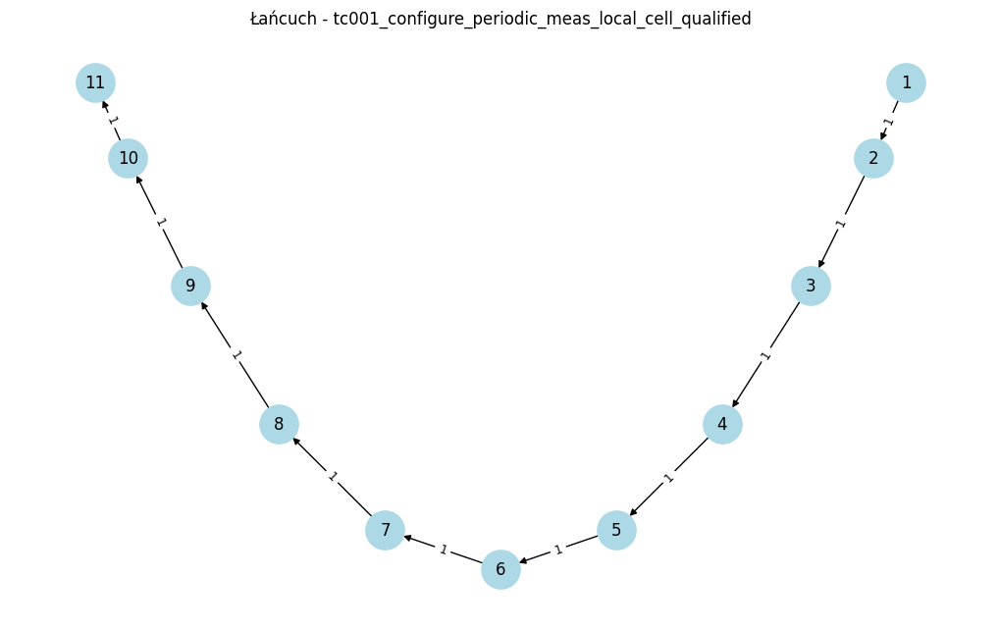

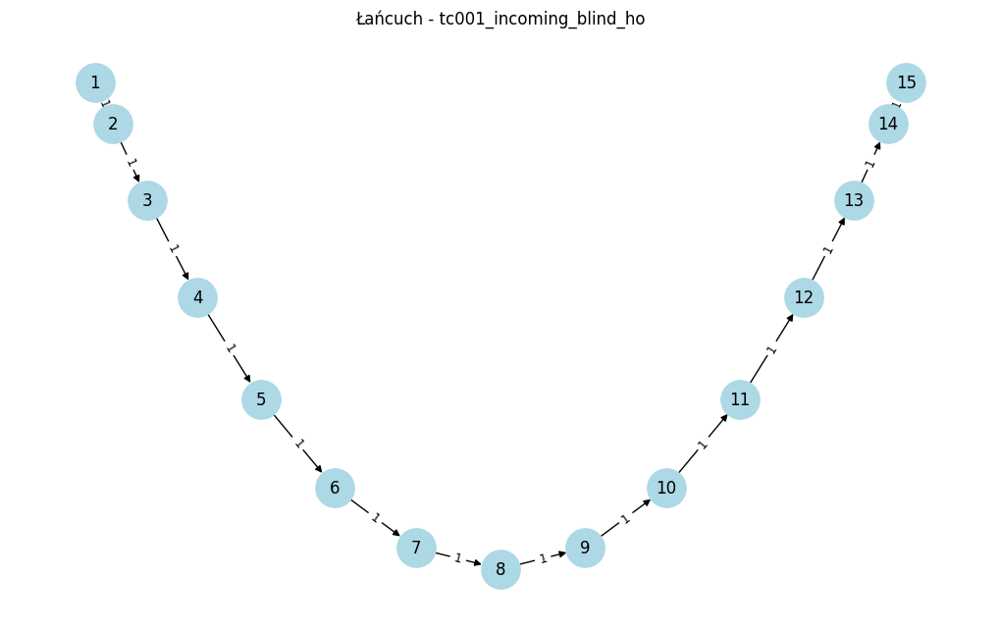

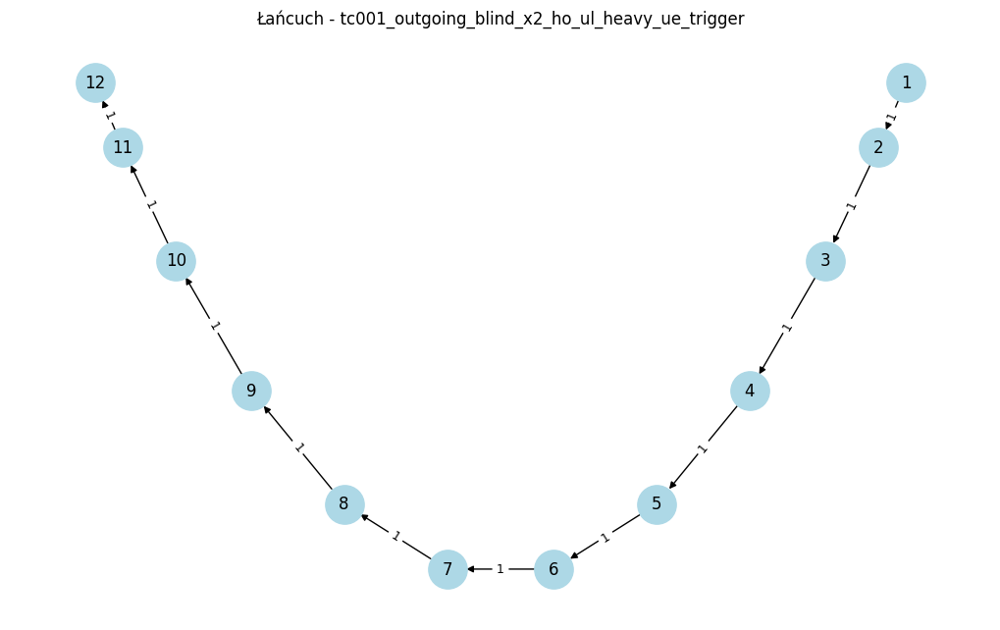

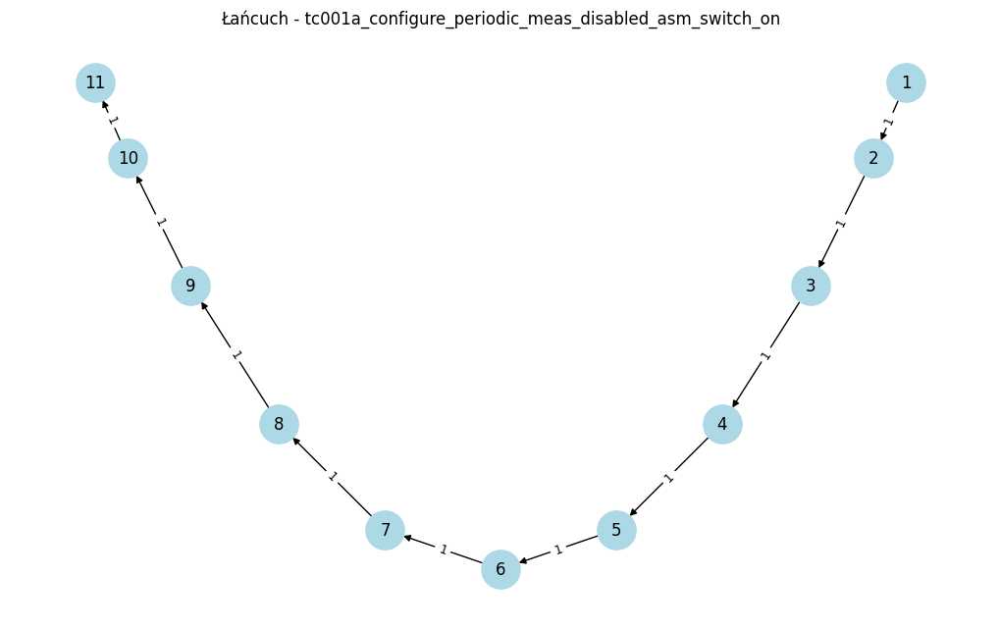

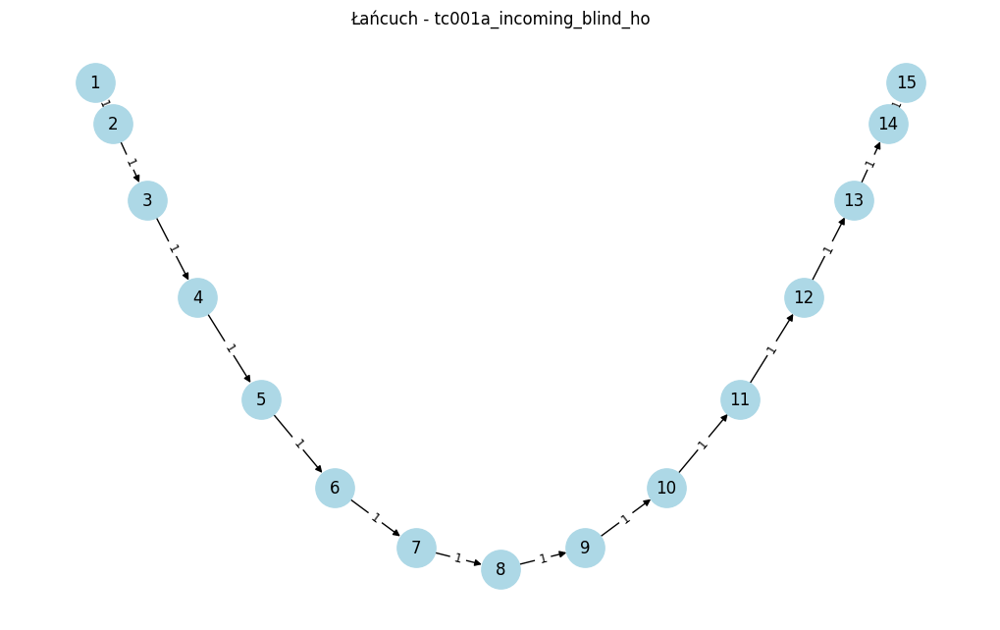

...

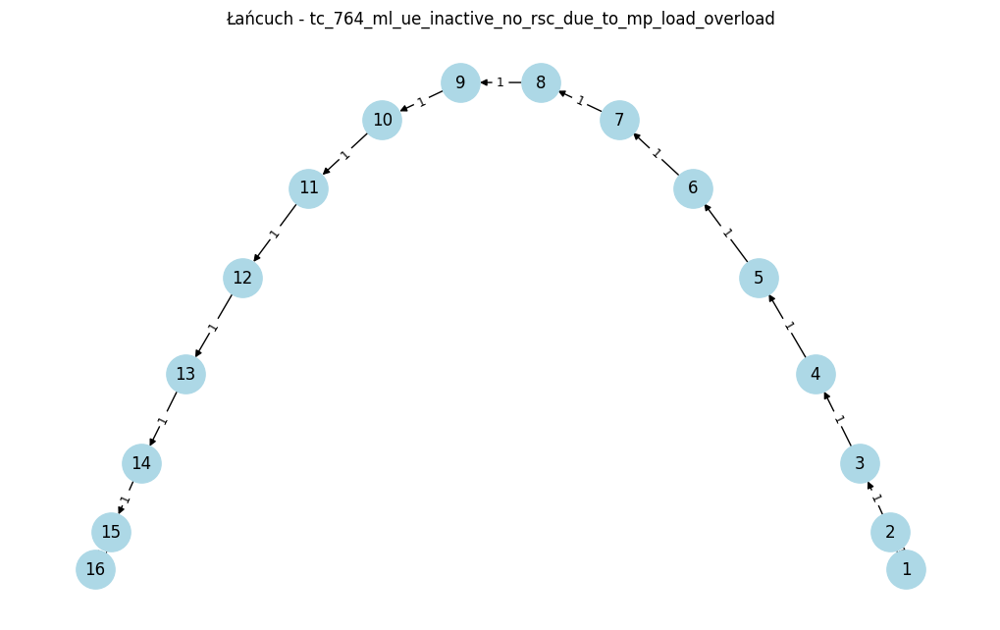

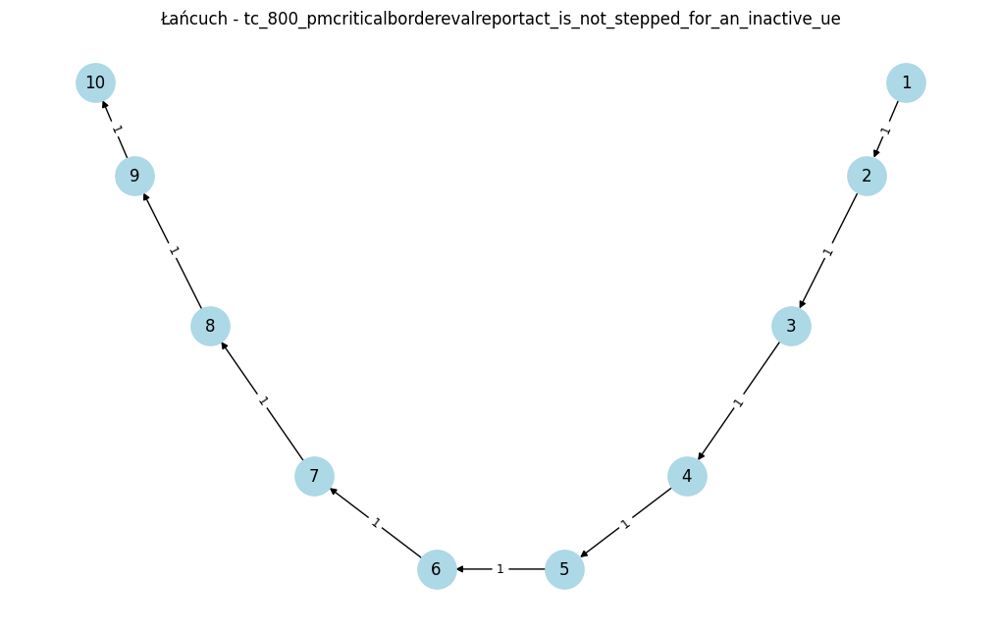

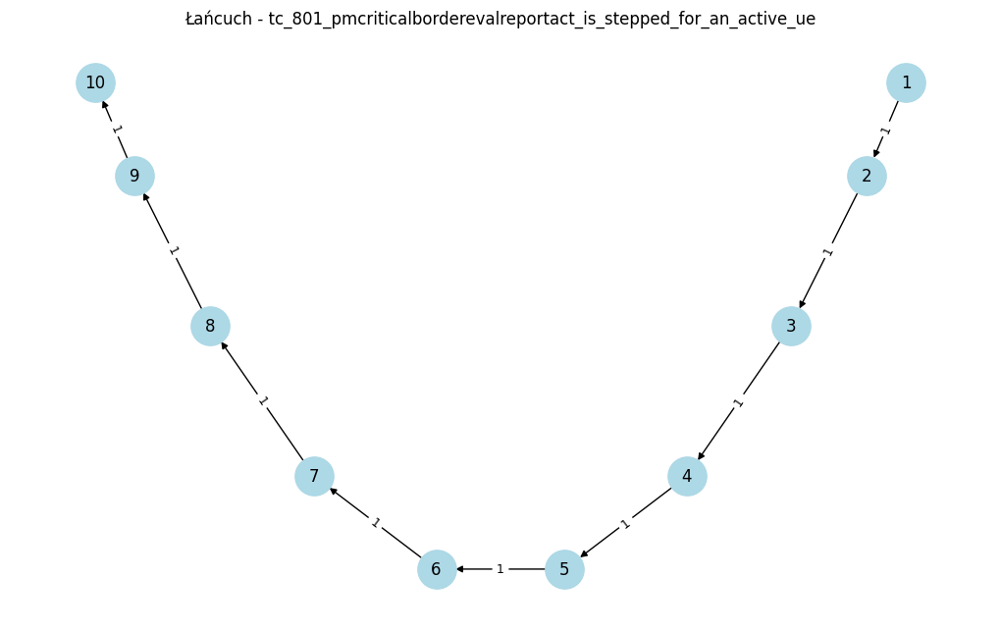

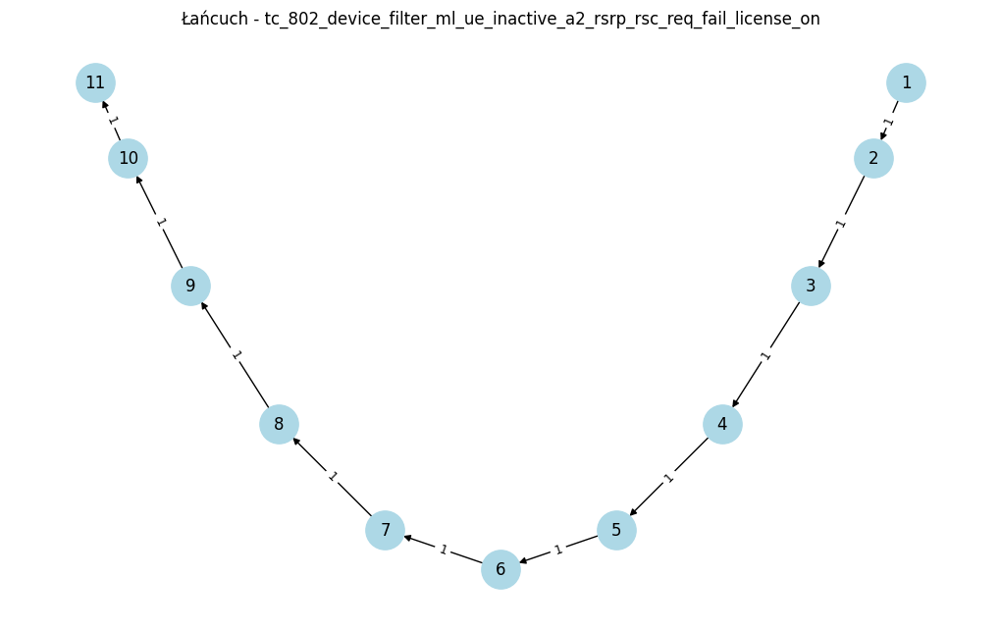

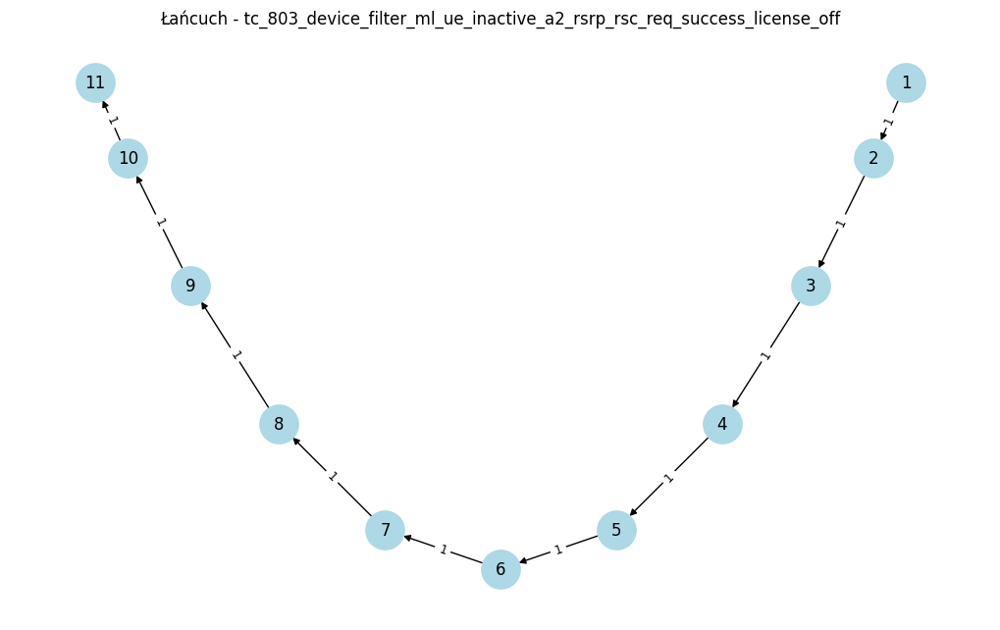

In [ ]:
def chains(df):
    graphs = {}

    for tc_name, df_tc in df.groupby("tc_name"):
        hashes = df_tc["content_earfcn_hash"].tolist()

        G = nx.DiGraph()

        for i in range(len(hashes)):
            G.add_edge(
                i + 1,
                i + 2,
                hash=hashes[i],
                weight=1
            )

        graphs[tc_name] = G

    return graphs

graphs = chains(df_cleaned)

for tc_name, G in graphs.items():

    pos = nx.spectral_layout(G)
    plt.figure(figsize=(10, 6))

    nx.draw(G, pos, with_labels=True,
            node_size=800, node_color="lightblue")

    edge_labels = {(u, v): d["weight"] for u, v, d in G.edges(data=True)}
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=9)

    plt.title(f"Łańcuch - {tc_name}")
    plt.show()


In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def hash_to_edges(G):
      mapping = {}
      for (u, v, attrs) in G.edges(data=True):
          h = attrs.get("hash")
          if h is not None:
              mapping.setdefault(h, []).append((u, v))
      return mapping

def merge_graphs(base: nx.DiGraph, new: nx.DiGraph, tc_name: str):
    base_hashes = hash_to_edges(base)
    new_hashes  = hash_to_edges(new)

    common_hashes = set(base_hashes.keys()) & set(new_hashes.keys())

    node_map = {}
    for h in common_hashes:
        for (u_new, v_new) in new_hashes[h]:
            u_base, v_base = base_hashes[h][0]
            node_map[u_new] = u_base
            node_map[v_new] = v_base

    current_max = max(base.nodes) if len(base.nodes) else 0
    next_available = current_max + 1
    for n in new.nodes:
        if n not in node_map:
            node_map[n] = next_available
            next_available += 1

    for local, global_ in node_map.items():
        if global_ not in base.nodes:
            base.add_node(global_)
    for (u, v, attrs) in new.edges(data=True):
        u_mapped = node_map[u]
        v_mapped = node_map[v]

        if u_mapped == v_mapped:
            continue

        if base.has_edge(u_mapped, v_mapped):
            edge_data = base[u_mapped][v_mapped]
            edge_data.setdefault("origin", []).append({"graph": tc_name,"u": u,"v": v})
        else:
            base.add_edge(u_mapped,v_mapped,**attrs, origin=[{"graph": tc_name,"u": u,"v": v}])

    return base

In [ ]:
def draw_graph(g,size=100,layout="kk",figsize=(20, 20),title="",show=True):
    if layout == "kk":
        pos = nx.kamada_kawai_layout(g)
    else:
        pos = nx.spring_layout(g)

    colors = ["red" if g.degree(n) > 2 else "blue" for n in g.nodes()]

    plt.figure(figsize=figsize)
    nx.draw(
        g,
        pos,
        edge_color="black",
        node_size=size,
        node_color=colors,
        alpha=0.9,
        labels={n: n for n in g.nodes()}
    )

    edge_labels = {
        (u, v): data["hash"][:4]
        for u, v, data in g.edges(data=True)
        if "hash" in data
    }

    nx.draw_networkx_edge_labels(
        g,
        pos,
        edge_labels=edge_labels,
        font_color="red"
    )

    plt.title(title)
    plt.axis("off")
    plt.show()

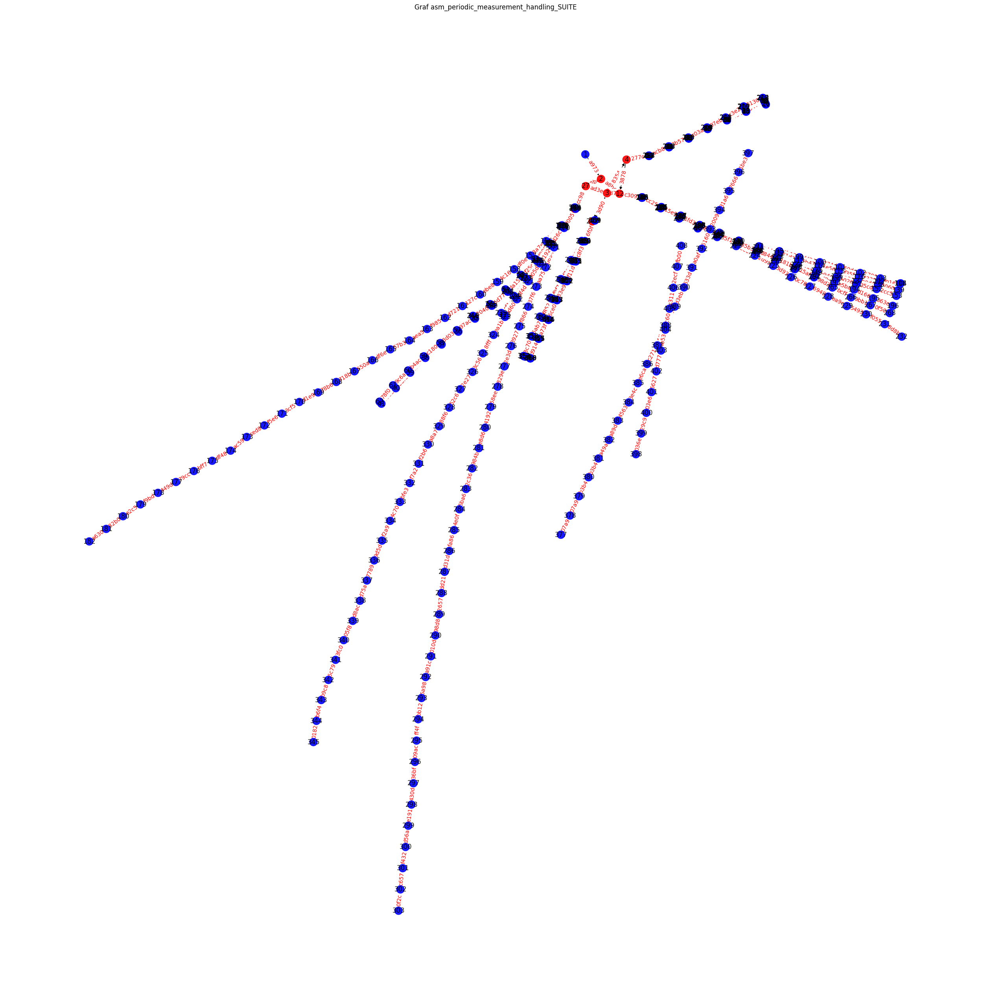

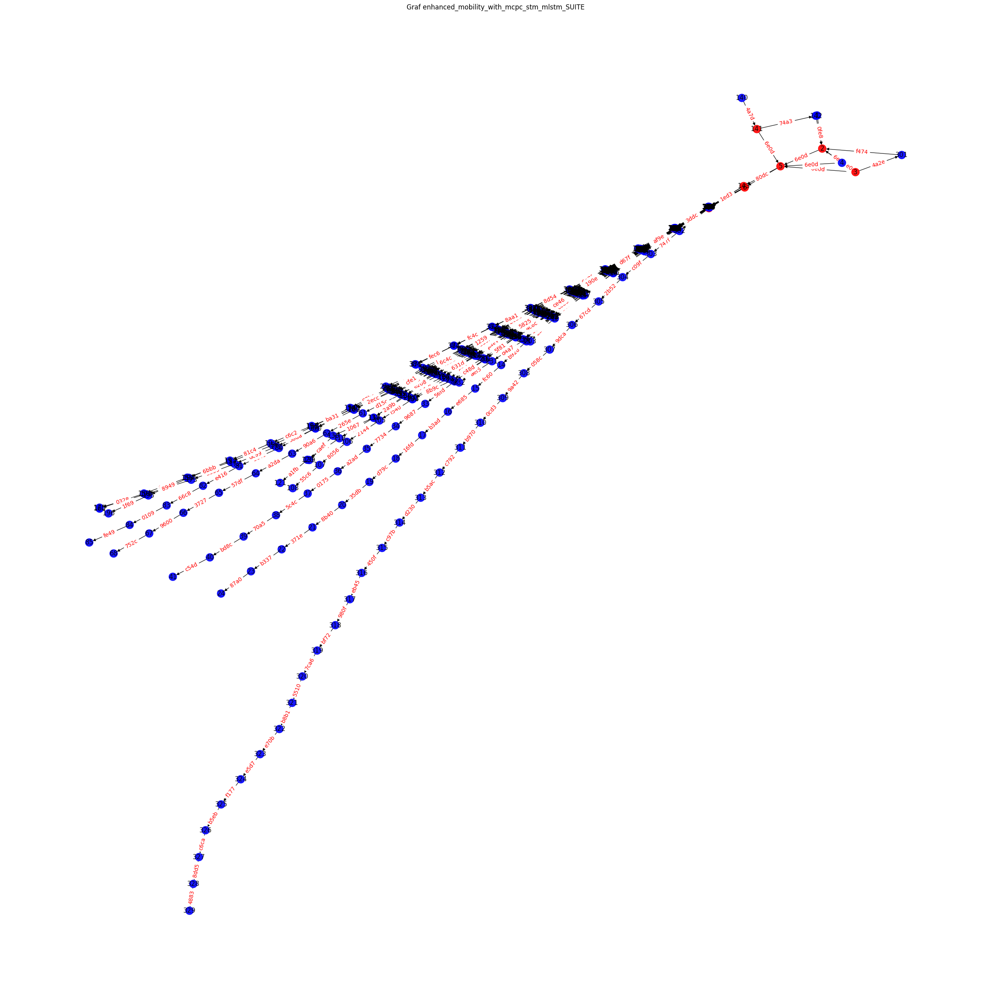

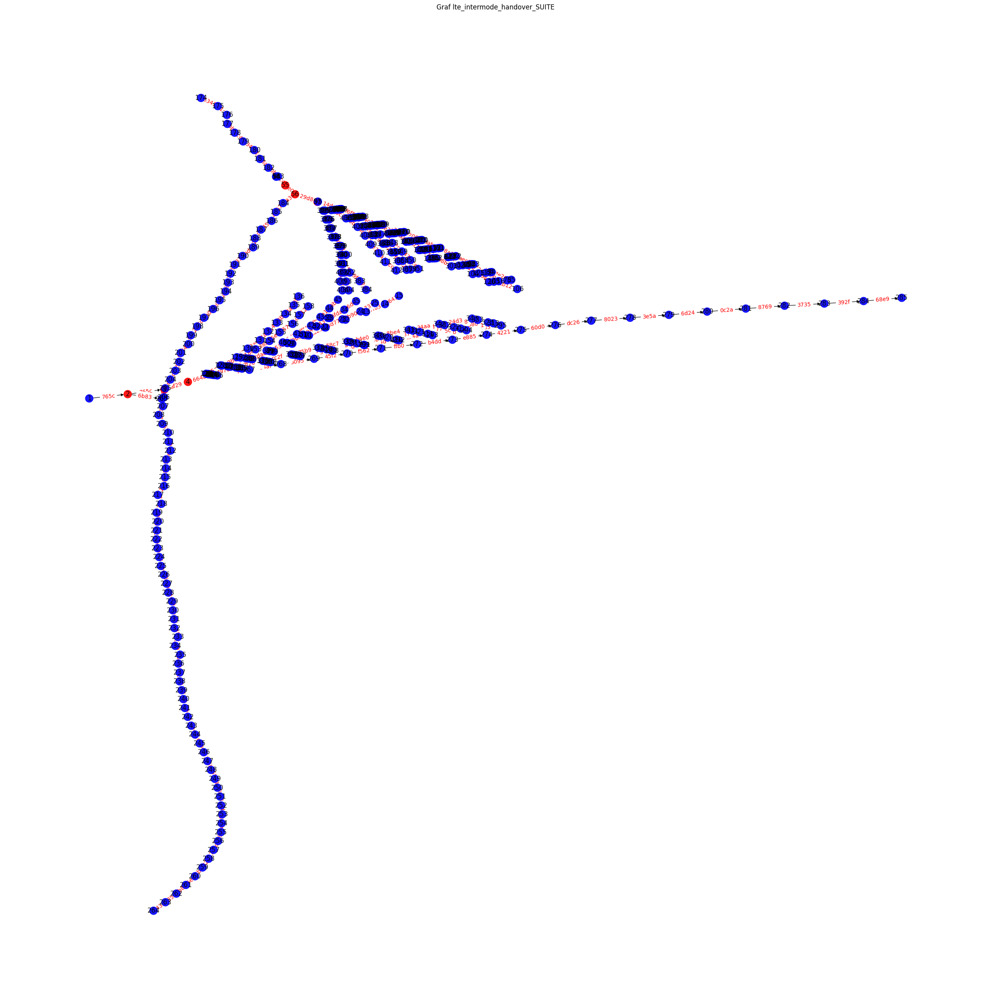

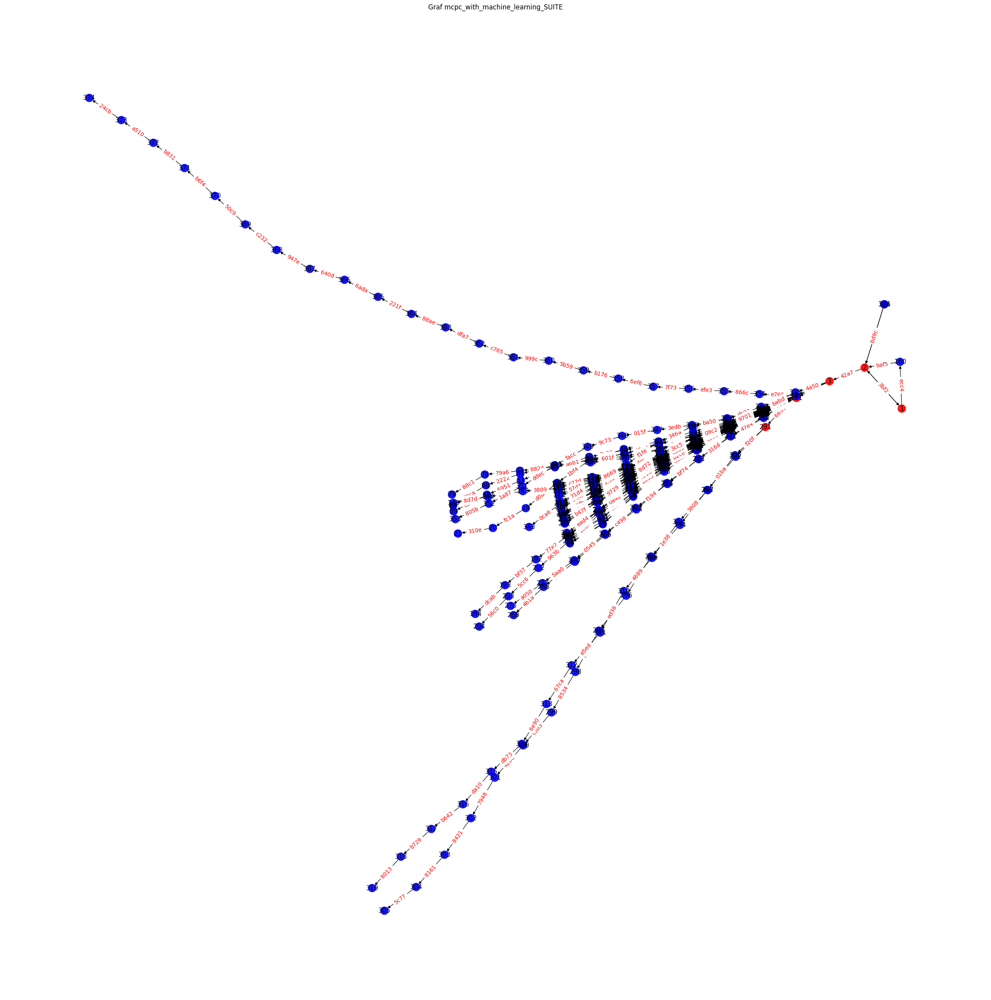

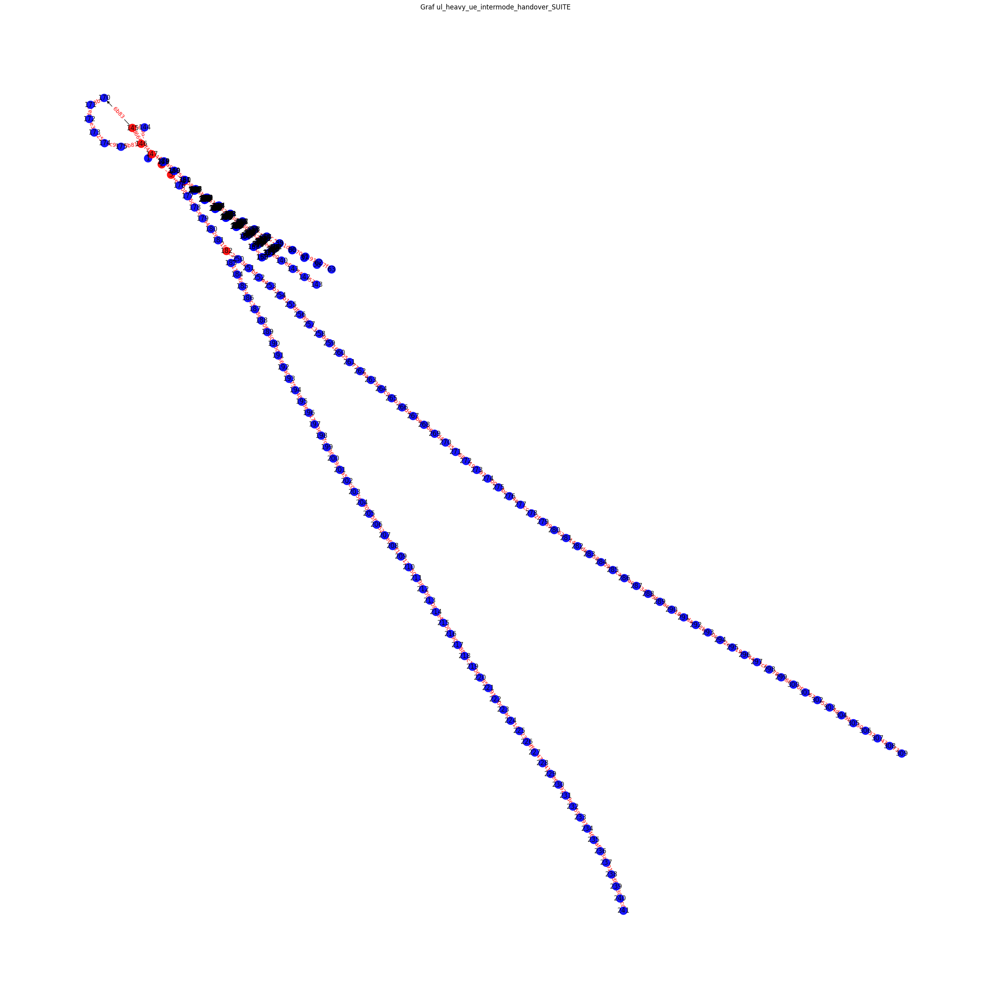

In [ ]:
for suite_name in df_cleaned["suite_name"].unique():
    suite1 = df_filtered[df_filtered["suite_name"]==suite_name]
    s1 = {}
    for tc, df_tc in suite1.groupby("tc_name"):
        hashes = df_tc["content_earfcn_hash"].tolist()

        g = nx.DiGraph()

        for i, h in enumerate(hashes):
            g.add_edge(i + 1, i + 2, hash=h)

        s1[tc] = g
        graph1 = nx.DiGraph()

    for tc, g in s1.items():
        merge_graphs(graph1, g, tc)
    draw_graph(
        graph1,
        size=200,
        layout="kk",
        figsize=(25,25),
        title=f"Graf {suite_name}"
    )

In [ ]:
suite_counts_c = df_cleaned["suite_name"].value_counts()
selected_suites = set(suite_counts_c.index)
df5 = df_cleaned[df_cleaned["suite_name"].isin(selected_suites)]

In [ ]:
df5

,suite_id,suite_name,group,tc_name,name,specific_name,date,time,singal_area,source,content,kwargs,earfcn,content_earfcn,content_earfcn_hash
10877,238731601,asm_periodic_measurement_handling_SUITE,fdd,tc001a_configure_periodic_meas_disabled_asm_sw...,RRC-UL-CCCH-Message,RRC-RRCConnectionRequest,2024-08-12,18:05:43.751,rrc,send,#'RRC-UL-CCCH-Message'{\n message = \n ...,"{'node': 'msue', 'imsi': '987653', 'rb': 'srb0...",300,#'RRC-UL-CCCH-Message'{\n message = \n ...,a973ed2efa35f35570d2408130977d0b0e420a96168775...
10878,238731601,asm_periodic_measurement_handling_SUITE,fdd,tc001a_configure_periodic_meas_disabled_asm_sw...,RRC-DL-CCCH-Message,RRC-RRCConnectionSetup,2024-08-12,18:05:43.755,rrc,recv,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...","{'node': 'msue', 'imsi': '987653', 'rb': 'srb0...",300,"#'RRC-DL-CCCH-Message'{\n message = \n {c1,\n...",a8beea557f53b4c266efeb19cec33e67c16215c1825cb2...
10879,238731601,asm_periodic_measurement_handling_SUITE,fdd,tc001a_configure_periodic_meas_disabled_asm_sw...,UP_ULRLCPE_RRCC_UL_COM_DATA_IND,NaN,2024-08-12,18:05:43.752,ose,send,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,"{'sig_no': '23068930', 'imsi': '987653', 'crnt...",0,#'UP_ULRLCPE_RRCC_UL_COM_DATA_IND'{\n cellI...,3878d2b48cdbb0d9b92644db4cff7e0c5d7d776c76780f...
10880,238731601,asm_periodic_measurement_handling_SUITE,fdd,tc001a_configure_periodic_meas_disabled_asm_sw...,BBMC_BBUEME_UEMI_UE_SETUP_REQ,NaN,2024-08-12,18:05:43.753,ose,recv,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,"{'sig_no': '23134722', 'imsi': '987653', 'send...",0,#'BBMC_BBUEME_UEMI_UE_SETUP_REQ'{\n bbTrans...,3fe31086449c5ab7647199ffb2229547a607b5721ad1f9...
10881,238731601,asm_periodic_measurement_handling_SUITE,fdd,tc001a_configure_periodic_meas_disabled_asm_sw...,BBMC_BBUEME_UEMI_UE_SETUP_CFM,NaN,2024-08-12,18:05:43.754,ose,send,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,"{'sig_no': '23134723', 'imsi': '987653', 'send...",0,#'BBMC_BBUEME_UEMI_UE_SETUP_CFM'{\n bbTrans...,7a734a4176487bb2b0080c3dc226b087f6dcb794c6d1c2...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
281819,238733576,ul_heavy_ue_intermode_handover_SUITE,tdd,tc026_report_unknown_pci_by_utvm_will_not_trig...,BBMC_BBUEME_UEMI_UE_SECURITY_CONFIG_REQ,NaN,2024-08-12,20:28:02.792,ose,recv,#'BBMC_BBUEME_UEMI_UE_SECURITY_CONFIG_REQ'{\n ...,"{'sig_no': '23134727', 'imsi': '1001', 'sender...",0,#'BBMC_BBUEME_UEMI_UE_SECURITY_CONFIG_REQ'{\n ...,657f85a08a21c01030bb1035d07c26ac0ed985e6de6911...
281820,238733576,ul_heavy_ue_intermode_handover_SUITE,tdd,tc026_report_unknown_pci_by_utvm_will_not_trig...,S1AP-InitialUEMessage,NaN,2024-08-12,20:28:02.786,s1ap,recv,#'S1AP-InitialUEMessage'{\n protocolIEs = \...,"{'node': 'mme', 'direction': 'recv', 'pco': 'c...",0,#'S1AP-InitialUEMessage'{\n protocolIEs = \...,78fafd05c71fd55c54f8356b4a153fb69a6c34b0856ced...
281821,238733576,ul_heavy_ue_intermode_handover_SUITE,tdd,tc026_report_unknown_pci_by_utvm_will_not_trig...,S1AP-UplinkNASTransport,NaN,2024-08-12,20:28:02.790,s1ap,recv,#'S1AP-UplinkNASTransport'{\n protocolIEs =...,"{'node': 'mme', 'direction': 'recv', 'pco': 'c...",0,#'S1AP-UplinkNASTransport'{\n protocolIEs =...,f47b68323419745bb526f38c8b47a10efa7d12399f4661...
281822,238733576,ul_heavy_ue_intermode_handover_SUITE,tdd,tc026_report_unknown_pci_by_utvm_will_not_trig...,S1AP-UplinkNASTransport,NaN,2024-08-12,20:28:02.813,s1ap,recv,#'S1AP-UplinkNASTransport'{\n protocolIEs =...,"{'node': 'mme', 'direction': 'recv', 'pco': 'c...",0,#'S1AP-UplinkNASTransport'{\n protocolIEs =...,c531cf20925f69aa68e255427dab43038e6aa3ec2e0601...


In [ ]:
select5 = {}
for tc, df_tc in df5.groupby("tc_name"):
    hashes = df_tc["content_earfcn_hash"].tolist()

    g = nx.DiGraph()

    for i, h in enumerate(hashes):
        g.add_edge(i + 1, i + 2, hash=h)

    select5[tc] = g

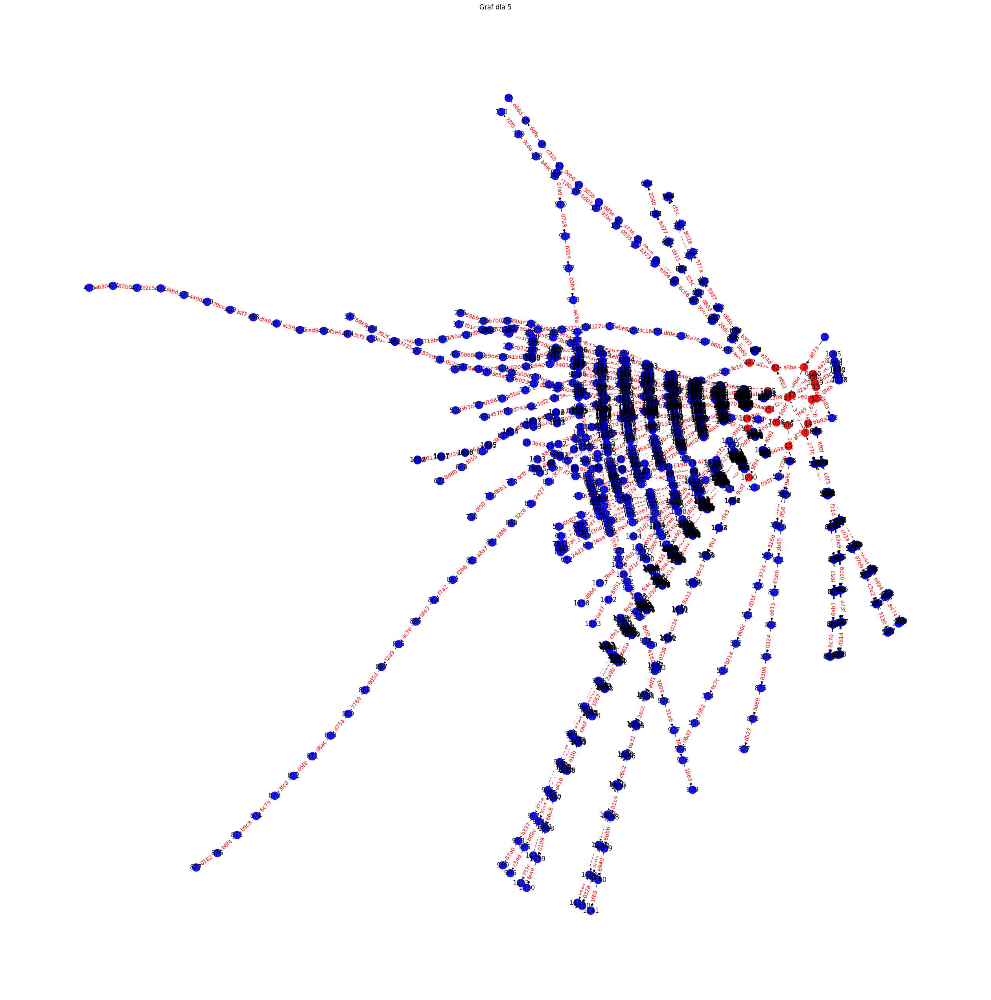

In [ ]:
merged5 = nx.DiGraph()
for tc, g in select5.items():
    merge_graphs(merged5, g, tc)
draw_graph(
    merged5,
    size=200,
    layout="kk",
    figsize=(25,25),
    title="Graf dla 5"
)